In [190]:
# Install the Spotify Library
!pip install Spotipy

In [5]:
import pandas as pd
import numpy as np
import datetime
import time
from math import pi, ceil

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np
import datetime
import time
from math import pi, ceil

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [1]:
import pandas as pd
df_all = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/allsong_data.csv')
df_complete = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/complete_feature.csv')
df_processed = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/processed_data.csv')
df_raw = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/raw_data.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/test_playlist.csv')

In [2]:
# Drop everything that's not importatn for model building... 
df_new = df_processed[['artist_name','track_name','duration_ms_x','duration_ms_y','album_name','name','danceability', 'energy', 'key', 'loudness', 'mode',
'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo','time_signature']]
df_new['playlist_track'] = 1


# Let's take out everything that's not needed
df_new_test = df_test[['artist_name','track_name','duration_ms_x','duration_ms_y','album_name','name','danceability', 'energy', 'key', 'loudness', 'mode',
'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo','time_signature']]
df_new_test['playlist_track'] = 0

<ipython-input-2-7d2272b815e0>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['playlist_track'] = 1
<ipython-input-2-7d2272b815e0>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_test['playlist_track'] = 0


# Scaling

In [3]:
# Is there actual difference with the playlists, given these attributes...To compare, let's standardize speech, duration, loudness, and tempo on the same
#  scale as everyone else...

# Scale features down to 0-1
df_new['scaled_speech'] = (df_new['speechiness'] - min(df_new['speechiness'])) / (max(df_new['speechiness']) - min(df_new['speechiness']))
df_new['scaled_duration'] = (df_new['duration_ms_x'] - min(df_new['duration_ms_x'])) / (max(df_new['duration_ms_x']) - min(df_new['duration_ms_x']))
df_new['scaled_loudness'] = (df_new['loudness'] - min(df_new['loudness'])) / (max(df_new['loudness']) - min(df_new['loudness']))
df_new['scaled_tempo'] = (df_new['tempo'] - min(df_new['tempo'])) / (max(df_new['tempo']) - min(df_new['tempo']))
df_new.head()

df_new_test['scaled_speech'] = (df_new_test['speechiness'] - min(df_new_test['speechiness'])) / (max(df_new_test['speechiness']) - min(df_new_test['speechiness']))
df_new_test['scaled_duration'] = (df_new_test['duration_ms_x'] - min(df_new_test['duration_ms_x'])) / (max(df_new_test['duration_ms_x']) - min(df_new_test['duration_ms_x']))
df_new_test['scaled_loudness'] = (df_new_test['loudness'] - min(df_new_test['loudness'])) / (max(df_new_test['loudness']) - min(df_new_test['loudness']))
df_new_test['scaled_tempo'] = (df_new_test['tempo'] - min(df_new_test['tempo'])) / (max(df_new_test['tempo']) - min(df_new_test['tempo']))
df_new_test.head()

<ipython-input-3-2462c4e7315f>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['scaled_speech'] = (df_new['speechiness'] - min(df_new['speechiness'])) / (max(df_new['speechiness']) - min(df_new['speechiness']))
<ipython-input-3-2462c4e7315f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['scaled_duration'] = (df_new['duration_ms_x'] - min(df_new['duration_ms_x'])) / (max(df_new['duration_ms_x']) - min(df_new['duration_ms_x']))
<ipython-input-3-2462c4e7315f>:7: SettingWithCopyWarning: 
A val

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,time_signature,playlist_track,scaled_speech,scaled_duration,scaled_loudness,scaled_tempo
0,The Killers,Mr. Brightside,222586,222587,Hot Fuss,Mom's playlist,0.356,0.924,1,-3.740,...,0.000000,0.0953,0.232,148.017,4,0,0.355612,0.176878,0.773088,0.628729
1,Rihanna,We Found Love,215226,215227,Talk That Talk,Mom's playlist,0.734,0.766,1,-4.485,...,0.001380,0.1080,0.600,127.986,4,0,0.087642,0.157552,0.667564,0.451642
2,American Authors,Best Day Of My Life,194240,194240,"Oh, What A Life",Mom's playlist,0.670,0.905,2,-2.385,...,0.000151,0.0577,0.516,100.021,4,0,0.059899,0.102445,0.965014,0.204413
3,Clean Bandit,Rather Be (feat. Jess Glynne),227833,227833,I Cry When I Laugh,Mom's playlist,0.799,0.586,11,-6.735,...,0.000002,0.1930,0.549,120.970,4,0,0.083859,0.190656,0.348867,0.389616
4,Sia,Chandelier,216120,216120,1000 Forms Of Fear,Mom's playlist,0.399,0.787,1,-2.880,...,0.000061,0.0685,0.572,117.089,5,0,0.160782,0.159899,0.894901,0.355305


### Here you can change the notes and everyting major minor (ABCD)keys, but do this later if you have time. 
### Not now

In [6]:
#Get both to numpy arrays
df_new_array = np.array(df_new.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))
df_test_new_array = np.array(df_new_test.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))

In [7]:
from scipy import sparse
from sklearn.metrics.pairwise import cosine_similarity

# turn both arrays into sparse matrices
df_new_sparse = sparse.csr_matrix(df_new_array)
df_test_new_sparse = sparse.csr_matrix(df_test_new_array)

# get cosine similarities between user playlist and record label
cosim = cosine_similarity(df_new_sparse, df_test_new_sparse,dense_output=True)
print(cosim[0])

[1.         1.         1.         1.         1.         0.99999999
 0.99999999 1.         1.         1.         0.99999996 1.
 1.         1.         0.99999999 1.         1.         1.
 0.99999999 0.99999438 0.99999999 0.99999999 1.         1.
 1.         1.         1.         1.         0.99999997 1.
 1.         1.         1.         1.         1.         0.99999998
 0.99999998 1.         0.99999996 0.99999998 0.99999999 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         0.99999997 0.99999997 1.
 1.         0.99999999 1.         0.99999999 1.         1.
 1.         1.         1.         0.99999998 1.         1.
 1.         0.99999995 1.         1.         1.         1.
 1.         1.         0.99999997]


In [8]:
# Make Recommendations
# Sort by highest similarities and map the output to song names/artists

for i in range(len(cosim)):
    print('Songs similar to', df_new.iloc[i]['track_name'],':\n' )
    print(sorted(list(zip(cosim[i],df_new_test['name'], df_new_test['artist_name'])), reverse=True)[:2])
    print('============')
    print('================================================================================================================')

Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", 'DNCE')]
Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", 'DNCE')]
Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", 'DNCE')]
Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", 'DNCE')]
Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", 'DNCE')]
Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999636371, "Mom's playlist", 'Clean Bandit'), (0.9999999999633459, "Mom's playlist", '

In [70]:
# Repeating the summary by attribute by adding the scaled variables as well...
continuous_features = ['scaled_loudness', 'scaled_tempo', 'scaled_duration', 'scaled_speech',
                    'valence',  'liveness', 'instrumentalness', 'energy', 'danceability', 'acousticness']
grouped_by_playlist = df_new.groupby('name')[continuous_features].mean()
grouped_by_playlist.sample(5)

,scaled_loudness,scaled_tempo,scaled_duration,scaled_speech,valence,liveness,instrumentalness,energy,danceability,acousticness
name,,,,,,,,,,
Julion alvarez,0.870741,0.601539,0.082581,0.068168,0.801388,0.160776,0.000201,0.603449,0.688265,0.428853
quiet,0.800209,0.480220,0.097170,0.053503,0.251600,0.119000,0.007626,0.418500,0.469100,0.351100
mix,0.871416,0.590406,0.100074,0.052089,0.490500,0.201990,0.001056,0.769100,0.485500,0.037273
summer playlist,0.869588,0.561387,0.086412,0.123441,0.478278,0.178883,0.005502,0.764333,0.636556,0.117079
Camp,0.860076,0.693425,0.049207,0.081497,0.480500,0.190500,0.000021,0.740000,0.559500,0.000741


In [72]:
# Repeating just for popular players
df_popular_playlists = df_new[df_new['name'].isin(['Country','Worship','2012','musicals','Favorite Songs'
                                                  ,'Classical','spanish jams', 'country', 'Belters', 'Gospel'])]
grouped_by_playlist = df_popular_playlists.groupby('name')[continuous_features].mean()
grouped_by_playlist

,scaled_loudness,scaled_tempo,scaled_duration,scaled_speech,valence,liveness,instrumentalness,energy,danceability,acousticness
name,,,,,,,,,,
2012,0.820821,0.559849,0.096977,0.047927,0.435603,0.162352,0.141874,0.601155,0.522336,0.250039
Belters,0.858980,0.569025,0.097117,0.042976,0.447162,0.163075,0.002904,0.645524,0.553283,0.213527
Classical,0.652167,0.499954,0.091212,0.049469,0.242095,0.144925,0.716698,0.206065,0.339418,0.800383
Country,0.865245,0.575783,0.089705,0.043854,0.560942,0.176718,0.002119,0.727547,0.568149,0.180397
Favorite Songs,0.849416,0.558606,0.087142,0.065113,0.530009,0.160354,0.001683,0.637912,0.586763,0.270951
Gospel,0.836670,0.535768,0.131750,0.104057,0.472918,0.341812,0.023638,0.669243,0.523956,0.261293
Worship,0.830169,0.561242,0.135458,0.045506,0.250961,0.225481,0.005554,0.547234,0.425803,0.257487
country,0.825297,0.558490,0.085974,0.042114,0.601663,0.210193,0.006184,0.619043,0.610850,0.287012
musicals,0.761143,0.531311,0.080901,0.109732,0.394494,0.212258,0.019351,0.347714,0.483682,0.706022


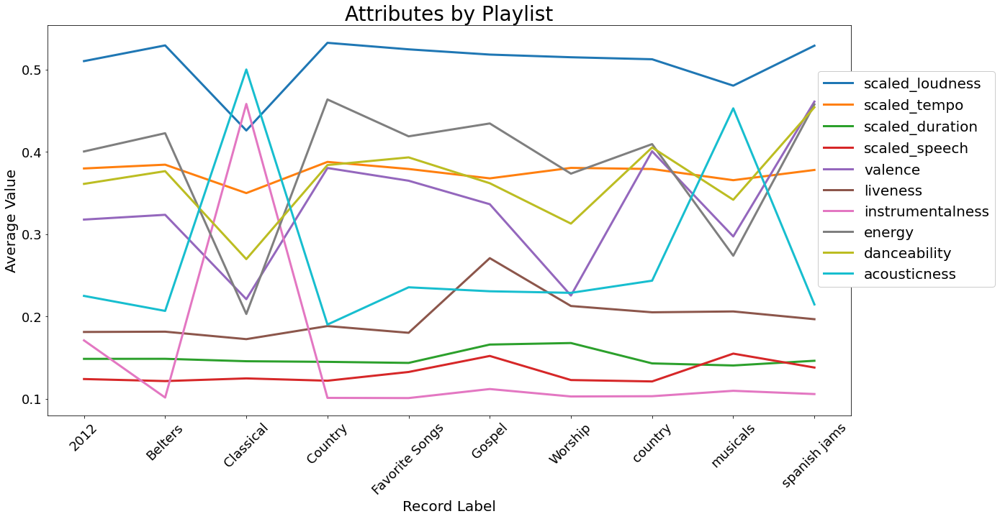

In [73]:
# plot the above dataframe
plt.figure(figsize=(20, 10))
for feat in continuous_features:
    x = grouped_by_playlist[feat]
    ax= sns.lineplot(x=x.index,y=x,label=feat,linewidth = 3, seed=4)

ax.set_title('Attributes by Playlist', fontsize=28);
ax.set_ylabel('Average Value', fontsize=20);
ax.set_xlabel('Record Label', fontsize=20);
ax.legend(prop=dict(size=20), loc='best', bbox_to_anchor=(.95, .9), framealpha=1.0);
ax.set_xticklabels(fontsize=18, labels=grouped_by_playlist.index, rotation=45);
ax.set_yticklabels(fontsize=18, labels=[0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1]);

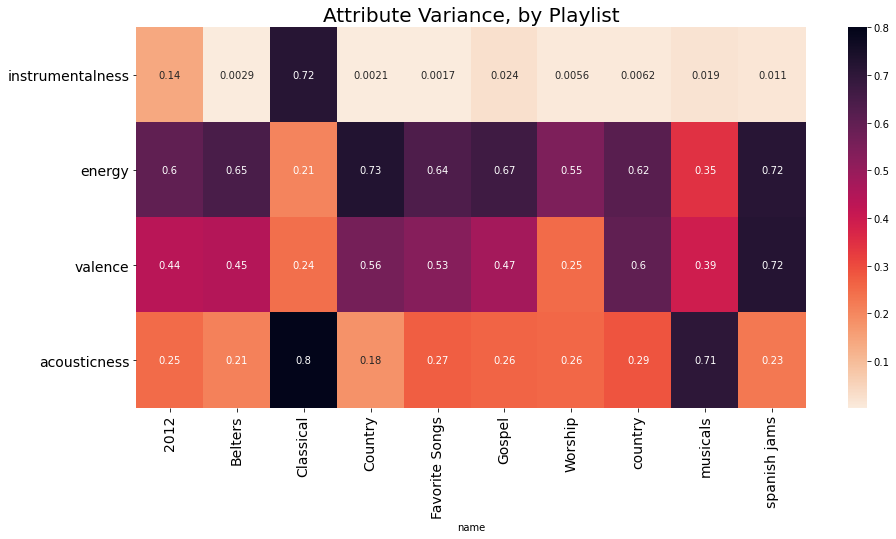

In [76]:
#Let's try to see the most varied feature in the top 10 playlists 
# pivot the table
pivoted = grouped_by_playlist.pivot_table(columns=grouped_by_playlist.index)

# make heatmap with most variant features
plt.figure(figsize=(15, 7));
plt.title('Attribute Variance, by Playlist', fontsize=20);
ax.set_ylim(-20, 20);
plt.xticks(fontsize=14);
plt.yticks(fontsize=14);
sns.heatmap(pivoted.loc[['instrumentalness', 'energy', 'valence', 'acousticness']],annot=True, cmap='rocket_r');

As we can see the most varied one is energy of the songs

# Testing Data

In [128]:
# label each playlist song in new column
df_new['playlist_track'] = 1
df_new


<ipython-input-128-4ab605c2cf30>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['playlist_track'] = 1


,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track
0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,226864,The Cookbook,Throwbacks,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,4,1
1,Britney Spears,Toxic,198800,198800,In The Zone,Throwbacks,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,4,1
2,Beyoncé,Crazy In Love,235933,235933,Dangerously In Love (Alben für die Ewigkeit),Throwbacks,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,4,1
3,Justin Timberlake,Rock Your Body,267266,267267,Justified,Throwbacks,0.892,0.714,4,-6.055,0,0.1410,0.20100,0.000234,0.0521,0.817,100.972,4,1
4,Shaggy,It Wasn't Me,227600,227600,Hot Shot,Throwbacks,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34245,Jon D,I Don't Know,189183,189184,Roots,thinking of you,0.669,0.228,2,-12.119,1,0.0690,0.79200,0.065000,0.0944,0.402,83.024,4,1
34246,Big Words,The Answer,263679,263680,"Hollywood, a Beautiful Coincidence",thinking of you,0.493,0.727,1,-5.031,1,0.2170,0.08730,0.000000,0.1290,0.289,73.259,4,1
34247,Allan Rayman,25.22,189213,189213,Roadhouse 01,thinking of you,0.702,0.524,7,-10.710,1,0.0793,0.33200,0.055300,0.2980,0.265,140.089,4,1
34248,Jon Jason,Good Feeling,194720,194720,Good Feeling,thinking of you,0.509,0.286,8,-14.722,1,0.1230,0.40200,0.000012,0.1310,0.259,121.633,4,1


In [95]:
import pandas as pd
data = pd.read_csv('https://raw.githubusercontent.com/enjuichang/PracticalDataScience-ENCA/main/data/test_playlist.csv')
df_test = data #44 Tracks with features 

In [130]:
# label each label track as 0 in the playlist column
df_test['playlist_track'] = 0
df_test

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms_x,album_name,name,danceability,...,tempo,type,id,uri,track_href,analysis_url,duration_ms_y,time_signature,artists_song,playlist_track
0,38,Frank Ocean,2ZWlPOoWh0626oTaHrnl2a,spotify:artist:2h93pZq0e7k5yf4dywlkpM,Ivy,spotify:album:3mH6qwIy9crq0I9YQbOuDf,249191,Blonde,thinking of you,0.567,...,116.362,audio_features,2ZWlPOoWh0626oTaHrnl2a,spotify:track:2ZWlPOoWh0626oTaHrnl2a,https://api.spotify.com/v1/tracks/2ZWlPOoWh062...,https://api.spotify.com/v1/audio-analysis/2ZWl...,249191,4,Frank OceanIvy,0
1,5,James Hersey,2kpziA4mHuM7Na6La4upg1,spotify:artist:0lzV2CiahHRiGd6qpADtPS,Coming Over - filous Remix,spotify:album:24zMrWtj8r3QmczFyWhrPM,198545,Coming Over,thinking of you,0.791,...,109.998,audio_features,2kpziA4mHuM7Na6La4upg1,spotify:track:2kpziA4mHuM7Na6La4upg1,https://api.spotify.com/v1/tracks/2kpziA4mHuM7...,https://api.spotify.com/v1/audio-analysis/2kpz...,198545,4,James HerseyComing Over - filous Remix,0
2,39,James Arthur,5uCax9HTNlzGybIStD3vDh,spotify:artist:4IWBUUAFIplrNtaOHcJPRM,Say You Won't Let Go,spotify:album:7oiJYvEJHsmYtrgviAVIBD,211466,Back from the Edge,thinking of you,0.358,...,85.043,audio_features,5uCax9HTNlzGybIStD3vDh,spotify:track:5uCax9HTNlzGybIStD3vDh,https://api.spotify.com/v1/tracks/5uCax9HTNlzG...,https://api.spotify.com/v1/audio-analysis/5uCa...,211467,4,James ArthurSay You Won't Let Go,0
3,1,Ingrid Michaelson,6zYqyOJuyXDOvWJwKkZ8tg,spotify:artist:2vm8GdHyrJh2O2MfbQFYG0,You and I,spotify:album:7o2VLivg95UduHjTMTIEIf,148400,Be OK,thinking of you,0.698,...,135.032,audio_features,6zYqyOJuyXDOvWJwKkZ8tg,spotify:track:6zYqyOJuyXDOvWJwKkZ8tg,https://api.spotify.com/v1/tracks/6zYqyOJuyXDO...,https://api.spotify.com/v1/audio-analysis/6zYq...,148400,4,Ingrid MichaelsonYou and I,0
4,21,gnash,1KKjApPXuCsMKfds56XD1Y,spotify:artist:3iri9nBFs9e4wN7PLIetAw,fragile (feat. WRENN),spotify:album:44gd6WEapMVZamu6hl3eET,185029,us,thinking of you,0.600,...,133.698,audio_features,1KKjApPXuCsMKfds56XD1Y,spotify:track:1KKjApPXuCsMKfds56XD1Y,https://api.spotify.com/v1/tracks/1KKjApPXuCsM...,https://api.spotify.com/v1/audio-analysis/1KKj...,185030,4,gnashfragile (feat. WRENN),0
5,31,Rihanna,4gFxywaJejXWxo0NjlWzgg,spotify:artist:5pKCCKE2ajJHZ9KAiaK11H,Close To You,spotify:album:3Q149ZH46Z0f3oDR7vlDYV,223226,ANTI,thinking of you,0.494,...,80.098,audio_features,4gFxywaJejXWxo0NjlWzgg,spotify:track:4gFxywaJejXWxo0NjlWzgg,https://api.spotify.com/v1/tracks/4gFxywaJejXW...,https://api.spotify.com/v1/audio-analysis/4gFx...,223227,4,RihannaClose To You,0
6,22,Mree,1bX27QQuIxzo3Lso2nTHpg,spotify:artist:3K8cGxW088HVyhFSGWJJcX,Lift Me Up,spotify:album:7hKN3sFBwF7GeCf2Rj4dsW,275826,Winterwell,thinking of you,0.508,...,125.177,audio_features,1bX27QQuIxzo3Lso2nTHpg,spotify:track:1bX27QQuIxzo3Lso2nTHpg,https://api.spotify.com/v1/tracks/1bX27QQuIxzo...,https://api.spotify.com/v1/audio-analysis/1bX2...,275827,4,MreeLift Me Up,0
7,30,The 1975,2TgxCUZdHFkPEVmFge1OSd,spotify:artist:3mIj9lX2MWuHmhNCA7LSCW,Fallingforyou,spotify:album:0mkOUedmYlOzCC4tOm2v0c,240670,The 1975,thinking of you,0.264,...,84.825,audio_features,2TgxCUZdHFkPEVmFge1OSd,spotify:track:2TgxCUZdHFkPEVmFge1OSd,https://api.spotify.com/v1/tracks/2TgxCUZdHFkP...,https://api.spotify.com/v1/audio-analysis/2Tgx...,240671,4,The 1975Fallingforyou,0
8,11,Lewis Watson,2JulIfUpaAfpiJgWDH2cL0,spotify:artist:40ELTAg7Kg6vbWnlyx2n9R,halo,spotify:album:4cKBAg2zgjrVF2XefrW4WC,199358,the morning,thinking of you,0.687,...,120.938,audio_features,2JulIfUpaAfpiJgWDH2cL0,spotify:track:2JulIfUpaAfpiJgWDH2cL0,https://api.spotify.com/v1/tracks/2JulIfUpaAfp...,https://api.spotify.com/v1/audio-analysis/2Jul...,199358,4,Lewis Watsonhalo,0
9,23,Timeflies,3nMIGUBmSu9QN6SzPLRQeg,spotify:artist:6dC0rIJNLSFZwqckLgXJ8p,Stuck With Me,spotify:album:00ylsrQy12tX2jFHVFbOLl,172133,Just For Fun,thinking of you,0.623,...,79.956,audio_features,3nMIGUBmSu9QN6SzPLRQeg,spotify:track:3nMIGUBmSu9QN6SzPLRQeg,https://api.spotify.com/v1/tracks/3nMIGUBmSu9Q...,ht

In [132]:
# Let's take out everything that's not needed
df_new_test = df_test[['artist_name','track_name','duration_ms_x','duration_ms_y','album_name','name','danceability', 'energy', 'key', 'loudness', 'mode',
'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo','time_signature','playlist_track']]
df_new_test

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track
0,Frank Ocean,Ivy,249191,249191,Blonde,thinking of you,0.567,0.3880,9,-9.579,0,0.0384,0.7820,0.000309,0.2480,0.4520,116.362,4,0
1,James Hersey,Coming Over - filous Remix,198545,198545,Coming Over,thinking of you,0.791,0.4940,8,-11.077,1,0.0456,0.4780,0.004750,0.0996,0.3170,109.998,4,0
2,James Arthur,Say You Won't Let Go,211466,211467,Back from the Edge,thinking of you,0.358,0.5570,10,-7.398,1,0.0590,0.6950,0.000000,0.0902,0.4940,85.043,4,0
3,Ingrid Michaelson,You and I,148400,148400,Be OK,thinking of you,0.698,0.2860,0,-7.632,1,0.0553,0.9270,0.000000,0.0883,0.5290,135.032,4,0
4,gnash,fragile (feat. WRENN),185029,185030,us,thinking of you,0.600,0.1020,4,-15.901,1,0.0334,0.7860,0.000004,0.1280,0.1240,133.698,4,0
5,Rihanna,Close To You,223226,223227,ANTI,thinking of you,0.494,0.1700,10,-11.368,1,0.0337,0.8950,0.000000,0.1390,0.1450,80.098,4,0
6,Mree,Lift Me Up,275826,275827,Winterwell,thinking of you,0.508,0.1300,4,-17.102,1,0.0349,0.9860,0.029100,0.0936,0.0774,125.177,4,0
7,The 1975,Fallingforyou,240670,240671,The 1975,thinking of you,0.264,0.2850,1,-15.208,1,0.0385,0.8920,0.000471,0.3440,0.0776,84.825,4,0
8,Lewis Watson,halo,199358,199358,the morning,thinking of you,0.687,0.2140,8,-9.651,1,0.0334,0.8440,0.000000,0.1110,0.3360,120.938,4,0
9,Timeflies,Stuck With Me,172133,172133,Just For Fun,thinking of you,0.623,0.3720,0,-13.379,1,0.0946,0.7000,0.000006,0.1100,0.2220,79.956,4,0


In [133]:
# create main dataframe using training songs and all test's songs, to be fed into model
main_df = pd.concat([df_new, df_new_test], axis=0).reset_index(drop=True)
main_df

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track
0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,226864,The Cookbook,Throwbacks,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,4,1
1,Britney Spears,Toxic,198800,198800,In The Zone,Throwbacks,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,4,1
2,Beyoncé,Crazy In Love,235933,235933,Dangerously In Love (Alben für die Ewigkeit),Throwbacks,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,4,1
3,Justin Timberlake,Rock Your Body,267266,267267,Justified,Throwbacks,0.892,0.714,4,-6.055,0,0.1410,0.20100,0.000234,0.0521,0.817,100.972,4,1
4,Shaggy,It Wasn't Me,227600,227600,Hot Shot,Throwbacks,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34289,Jon D,I Don't Know,189183,189184,Roots,thinking of you,0.669,0.228,2,-12.119,1,0.0690,0.79200,0.065000,0.0944,0.402,83.024,4,0
34290,Big Words,The Answer,263679,263680,"Hollywood, a Beautiful Coincidence",thinking of you,0.493,0.727,1,-5.031,1,0.2170,0.08730,0.000000,0.1290,0.289,73.259,4,0
34291,Allan Rayman,25.22,189213,189213,Roadhouse 01,thinking of you,0.702,0.524,7,-10.710,1,0.0793,0.33200,0.055300,0.2980,0.265,140.089,4,0
34292,Jon Jason,Good Feeling,194720,194720,Good Feeling,thinking of you,0.509,0.286,8,-14.722,1,0.1230,0.40200,0.000012,0.1310,0.259,121.633,4,0


In [134]:
# convert main dataframe to array
dropped = main_df.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1)
dropped

,duration_ms_x,duration_ms_y,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,226863,226864,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,4
1,198800,198800,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,4
2,235933,235933,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,4
3,267266,267267,0.892,0.714,4,-6.055,0,0.1410,0.20100,0.000234,0.0521,0.817,100.972,4
4,227600,227600,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34289,189183,189184,0.669,0.228,2,-12.119,1,0.0690,0.79200,0.065000,0.0944,0.402,83.024,4
34290,263679,263680,0.493,0.727,1,-5.031,1,0.2170,0.08730,0.000000,0.1290,0.289,73.259,4
34291,189213,189213,0.702,0.524,7,-10.710,1,0.0793,0.33200,0.055300,0.2980,0.265,140.089,4
34292,194720,194720,0.509,0.286,8,-14.722,1,0.1230,0.40200,0.000012,0.1310,0.259,121.633,4


In [135]:
main_array = np.array(dropped)
main_array

array([[2.26863e+05, 2.26864e+05, 9.04000e-01, ..., 8.10000e-01,
        1.25461e+02, 4.00000e+00],
       [1.98800e+05, 1.98800e+05, 7.74000e-01, ..., 9.24000e-01,
        1.43040e+02, 4.00000e+00],
       [2.35933e+05, 2.35933e+05, 6.64000e-01, ..., 7.01000e-01,
        9.92590e+01, 4.00000e+00],
       ...,
       [1.89213e+05, 1.89213e+05, 7.02000e-01, ..., 2.65000e-01,
        1.40089e+02, 4.00000e+00],
       [1.94720e+05, 1.94720e+05, 5.09000e-01, ..., 2.59000e-01,
        1.21633e+02, 4.00000e+00],
       [2.57194e+05, 2.57195e+05, 6.39000e-01, ..., 2.64000e-01,
        1.17583e+02, 4.00000e+00]])

In [136]:
#CLUSTERING THEM TOGETHER


# instantiate kmeans class and set n_clusters
k_means = KMeans(random_state=1, n_clusters=6) # default n_clusters = 8

# fit to data
k_means.fit(main_array)

# predict which clusters each song belongs too
predicted_clusters = k_means.fit_predict(main_array)

# each instance was assigned to one of the clusters
predicted_clusters 

array([0, 0, 3, ..., 0, 0, 3], dtype=int32)

In [137]:
# concatenate cluster labels with main dataframe
pred_series = pd.Series(predicted_clusters)
main_df_w_pred = pd.concat([main_df, pred_series], axis=1)
main_df_w_pred.rename(columns={0:'cluster'},inplace=True)

In [138]:
#Inspect Each Cluster

# Inspect songs in cluster 0
main_df_w_pred[['name', 'artist_name', 'cluster', 'playlist_track']][main_df_w_pred.cluster==0]

,name,artist_name,cluster,playlist_track
0,Throwbacks,Missy Elliott,0,1
1,Throwbacks,Britney Spears,0,1
4,Throwbacks,Shaggy,0,1
6,Throwbacks,Usher,0,1
7,Throwbacks,The Pussycat Dolls,0,1
...,...,...,...,...
34286,thinking of you,Layla,0,0
34287,thinking of you,ROZES,0,0
34289,thinking of you,Jon D,0,0
34291,thinking of you,Allan Rayman,0,0


In [140]:
# Inspect songs in cluster 0
main_df_w_pred[['name', 'artist_name', 'cluster', 'playlist_track']][main_df_w_pred.cluster==4]

,name,artist_name,cluster,playlist_track
10179,Prayer,Christopher M. Georges,4,1
19795,Chill Sesh,The Supervillains,4,1
21722,halcyon,Ellie Goulding,4,1
25503,classical,Pyotr Ilyich Tchaikovsky,4,1
25505,classical,James Judd,4,1
25512,classical,Munich Symphony Orchestra,4,1
28614,New jams,Deftones,4,1
31108,I like these songs,D.VELOPED,4,1
31178,Worship,Jonathan David Helser,4,1
33114,Classical,Sergei Prokofiev,4,1


In [141]:
# Make Recommendations

# look at the clusters most similar to user's playlist
relevant_clusters = main_df_w_pred['cluster'][main_df_w_pred.playlist_track==0]

# drop the user playlist songs from df, so they aren't recommended again
pred_df = main_df_w_pred.drop(main_df_w_pred[main_df_w_pred.playlist_track==0].index)

In [143]:
# return one random recommendation from each cluster
recs=[]
for k in relevant_clusters:
    recs +=pred_df[['track_name', 'artist_name']][pred_df.cluster==k].sample(1, random_state=543).values.tolist()
    pred_df.drop(pred_df[['track_name', 'artist_name']][pred_df.cluster==k].sample(1, random_state=543).index,inplace=True)

print('Songs similar to your playlist:\n')
for song in recs:
    print(song[0]+', by '+ song[1])

Songs similar to your playlist:

Don’t Gotta Work It Out, by Fitz and The Tantrums
Big Rings, by Drake
It's A Vibe, by 2 Chainz
Mama Don’t Allow, by The Stanley Brothers
Go the Distance - From "Hercules"/Soundtrack, by Roger Bart
Put It On, by Big L
Sweater Weather, by The Neighbourhood
Beneath Your Beautiful, by Labrinth
They Want EFX, by Das EFX
Weepin’ Willow, by The Stanley Brothers
And We Run (feat. Xzibit), by Within Temptation
Every Teardrop Is a Waterfall, by Coldplay
Suddenly, by Hugh Jackman
Corazones, Corazoncitos, by Mazz
Creep, by Daniela Andrade
N.Y State of Mind, by Nas
Cocoa Hooves, by Glass Animals
Love Lost - Acoustic, by The Temper Trap
JDNT, by Glass Animals
TOO GOOD, by Troye Sivan
Ho, by Ludacris
Love And Hate, by Arrow Benjamin
My Eyes - feat. Gwen Sebastian, by Blake Shelton
Courtesy Call, by Thousand Foot Krutch
Split (Only U), by Tiësto
Family Guy Main Title, by Family Guy
Pom Pom, by Matthew Dear
The Gospel, by Ryan Stevenson
Something That Produces Results, 

# visualization of clusters

In [144]:
# get cluster centers from .cluster_centers_ attribute
centers = k_means.cluster_centers_

In [146]:
# pca
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(main_df.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))
pca_2d = pca.transform(main_df.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))

pca.explained_variance_ratio_

array([9.99257712e-01, 7.42209207e-04])

In [156]:
plt.figure(figsize=(20,15))
k_means.labels_[3]
plt.title('K-Means Clustering of.        Recommendations', fontsize=28)
plt.xlabel('Component 1', fontsize=20)
plt.ylabel('Component 2', fontsize=20)


for i in range(6, pca_2d.shape[0]):
    if k_means.labels_[i] == 0:
        c1 =plt.scatter(pca_2d[i,0],pca_2d[i,1],c='b', s=60);
    if k_means.labels_[i] == 1:
        c2 =plt.scatter(pca_2d[i,0],pca_2d[i,1],c='r', s=60);
    if k_means.labels_[i] == 2:
        c3=plt.scatter(pca_2d[i,0],pca_2d[i,1],c='orange', s=60);
    if k_means.labels_[i] == 3:
        c4=plt.scatter(pca_2d[i,0],pca_2d[i,1],c='g', s=60);
    if k_means.labels_[i] == 4:
        c5=plt.scatter(pca_2d[i,0],pca_2d[i,1],c='purple', s=60);
    if k_means.labels_[i] == 5:
        c6=plt.scatter(pca_2d[i,0],pca_2d[i,1],c='y', s=60);
plt.legend([c1, c2, c3, c4, c5, c6], ['Cluster 1', 'Cluster 2',
    'Cluster 3', 'Cluster 4','Cluster 5','Cluster 6', "User's Songs"], fontsize=20);

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7ff226589940> (for post_execute):


KeyboardInterrupt: 

# Optimization 

In [152]:
df_new

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track
0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,226864,The Cookbook,Throwbacks,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,4,1
1,Britney Spears,Toxic,198800,198800,In The Zone,Throwbacks,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,4,1
2,Beyoncé,Crazy In Love,235933,235933,Dangerously In Love (Alben für die Ewigkeit),Throwbacks,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,4,1
3,Justin Timberlake,Rock Your Body,267266,267267,Justified,Throwbacks,0.892,0.714,4,-6.055,0,0.1410,0.20100,0.000234,0.0521,0.817,100.972,4,1
4,Shaggy,It Wasn't Me,227600,227600,Hot Shot,Throwbacks,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34245,Jon D,I Don't Know,189183,189184,Roots,thinking of you,0.669,0.228,2,-12.119,1,0.0690,0.79200,0.065000,0.0944,0.402,83.024,4,1
34246,Big Words,The Answer,263679,263680,"Hollywood, a Beautiful Coincidence",thinking of you,0.493,0.727,1,-5.031,1,0.2170,0.08730,0.000000,0.1290,0.289,73.259,4,1
34247,Allan Rayman,25.22,189213,189213,Roadhouse 01,thinking of you,0.702,0.524,7,-10.710,1,0.0793,0.33200,0.055300,0.2980,0.265,140.089,4,1
34248,Jon Jason,Good Feeling,194720,194720,Good Feeling,thinking of you,0.509,0.286,8,-14.722,1,0.1230,0.40200,0.000012,0.1310,0.259,121.633,4,1


In [153]:
df_new_array = np.array(df_new.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))

In [154]:
# Inspect Distortion
# use distortion as metric to classify similarities betwen songs within df
distortion = []
for k in range(1, 26):  
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(df_new_array)
    distortion.append(kmeans.inertia_) # inertia_: sum of squared distances of samples to their closest cluster center

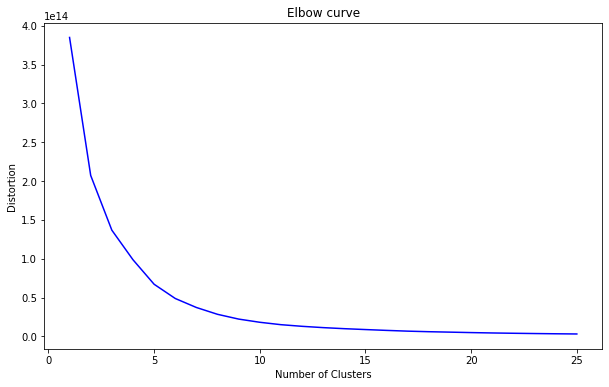

In [155]:
# Doing the elbow plot to find best k for this cluster
fig = plt.figure(figsize=(10, 6))
plt.plot(range(1, 26), distortion, c = 'b')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.title('Elbow curve')
plt.show()

In [ ]:
# Getting the test set automatically onboarded
# One of my playlists : https://open.spotify.com/playlist/7i7k54YRMrYj9EWOIUDL0V?si=e4424d5a25e74b2f

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util


# Get the id that's after the word playlist/ for any insterted playlist 
link = 'https://open.spotify.com/playlist/7i7k54YRMrYj9EWOIUDL0V?si=e4424d5a25e74b2f'    
sourcePlaylistID = link.partition("playlist/")[2]

cid ='1f6e50553633498ab6124e919954e688' # Client ID; copy this from your app 
secret = '744fdd83b05a49a1935230f2ccd40aee' # Client Secret; copy this from your app
username = 'amenti4k' # Your Spotify username

#for avaliable scopes see https://developer.spotify.com/web-api/using-scopes/
scope = 'user-library-read playlist-modify-public playlist-read-private'

redirect_uri='https://developer.spotify.com/dashboard/applications/1f6e50553633498ab6124e919954e688' # Paste your Redirect URI here

client_credentials_manager = SpotifyClientCredentials(client_id=cid, client_secret=secret) 

sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

token = util.prompt_for_user_token(username, scope, cid, secret, redirect_uri)

if token:
    sp = spotipy.Spotify(auth=token)
else:
    print("Can't get token for", username)

def getTrackIDs(user, playlist_id):
    ids = []
    playlist = sp.user_playlist(user, playlist_id)
    for item in playlist['tracks']['items']:
        track = item['track']
        ids.append(track['id'])
    return ids


ids = getTrackIDs('amenti4k', 'https://open.spotify.com/playlist/37i9dQZF1DWTkxQvqMy4WW?si=97502da51874485c')
    
    # Getting the track information such as track name, album, release date, length, and popularity, along with the list of audio features that Spotify’s API has to offer from each track ids.

def getTrackFeatures(id):
    meta = sp.track(id)
    features = sp.audio_features(id)
   # meta
    artist_name = meta['album']['artists'][0]['name']
    track_name = meta['name']
    duration_ms_x = meta['duration_ms']
    duration_ms_y = meta['duration_ms']
    
    
    album_name = meta['album']['name']
    name = 'new_playlist'
    #release_date = meta['album']['release_date']

    #popularity = meta['popularity']

  # features
    
    danceability = features[0]['danceability']
    energy = features[0]['energy']
    key = features[0]['key']
    loudness = features[0]['loudness']
    mode = features[0]['mode']
    speechiness = features[0]['speechiness']
    acousticness = features[0]['acousticness']
    instrumentalness = features[0]['instrumentalness']
    liveness = features[0]['liveness']
    valence = features[0]['valence']
    tempo = features[0]['tempo']
    time_signature = features[0]['time_signature']
    playlist_track = features[0]['time_signature']

    track = [[artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability, energy, key, loudness, mode,
speechiness, acousticness, instrumentalness, liveness, valence, tempo,time_signature,playlist_track]]
    return track

# Loop over the tracks and create a csv file containing all the songs

tracks = []
for i in range(len(ids)):
    time.sleep(.5)
    track = getTrackFeatures(ids[i])
    tracks.append(track)

# create dataset

df = pd.DataFrame(tracks, columns = df_test[['artist_name','track_name','duration_ms_x','duration_ms_y','album_name','name','danceability', 'energy', 'key', 'loudness', 'mode',
'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo','time_signature','playlist_track']])

In [13]:
# Getting the track information such as track name, album, release date, length, and popularity, along with the list of audio features that Spotify’s API has to offer from each track ids.

def getTrackFeatures(id):
    meta = sp.track(id)
    features = sp.audio_features(id)

  # meta
    artist_name = meta['album']['artists'][0]['name']
    track_name = meta['name']
    duration_ms_x = meta['duration_ms']
    duration_ms_y = meta['duration_ms']
    
    
    album_name = meta['album']['name']
    name = 'new_playlist'
    #release_date = meta['album']['release_date']

    #popularity = meta['popularity']

  # features
    
    danceability = features[0]['danceability']
    energy = features[0]['energy']
    key = features[0]['key']
    loudness = features[0]['loudness']
    mode = features[0]['mode']
    speechiness = features[0]['speechiness']
    acousticness = features[0]['acousticness']
    instrumentalness = features[0]['instrumentalness']
    liveness = features[0]['liveness']
    valence = features[0]['valence']
    tempo = features[0]['tempo']
    time_signature = features[0]['time_signature']
    playlist_track = features[0]['time_signature']

    track = [[artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability, energy, key, loudness, mode,
speechiness, acousticness, instrumentalness, liveness, valence, tempo,time_signature,playlist_track]]
    return track

In [13]:
# Getting the track information such as track name, album, release date, length, and popularity, along with the list of audio features that Spotify’s API has to offer from each track ids.

def getTrackFeatures(id):
    meta = sp.track(id)
    features = sp.audio_features(id)

  # meta
    artist_name = meta['album']['artists'][0]['name']
    track_name = meta['name']
    duration_ms_x = meta['duration_ms']
    duration_ms_y = meta['duration_ms']
    
    
    album_name = meta['album']['name']
    name = 'new_playlist'
    #release_date = meta['album']['release_date']

    #popularity = meta['popularity']

  # features
    
    danceability = features[0]['danceability']
    energy = features[0]['energy']
    key = features[0]['key']
    loudness = features[0]['loudness']
    mode = features[0]['mode']
    speechiness = features[0]['speechiness']
    acousticness = features[0]['acousticness']
    instrumentalness = features[0]['instrumentalness']
    liveness = features[0]['liveness']
    valence = features[0]['valence']
    tempo = features[0]['tempo']
    time_signature = features[0]['time_signature']
    playlist_track = features[0]['time_signature']

    track = [[artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability, energy, key, loudness, mode,
speechiness, acousticness, instrumentalness, liveness, valence, tempo,time_signature,playlist_track]]
    return track

In [189]:
link = 'https://open.spotify.com/playlist/7i7k54YRMrYj9EWOIUDL0V?si=e4424d5a25e74b2f'    
sourcePlaylistID = link.partition("playlist/")[2] 
sourcePlaylist = spotipy.user_playlist(username,sourcePlaylistID);
tracks = sourcePlaylist["tracks"];
songs = tracks["items"];

NameError: name 'spotipy' is not defined

In [ ]:
# Generalize for any music label and playlist

def cluster_recs(test, train):
    '''input 1: new user's music
        input 2: our suggestion base
        output: '''
    
    # Use the above functions to collect song attributes and clean data from Spotify API
    ....#This is where we take the test given to us, and try to match it to the style we have 
    (!!???) Ask for code here
    
    # create main dataframe using playlist songs and all label's songs, to be fed into model
    main_df = pd.concat([df_new, df_new_test], axis=0).reset_index(drop=True)
    # convert main dataframe to array
    dropped = main_df.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1)
    main_array = np.array(dropped)
    
    #CLUSTERING THEM TOGETHER
    # instantiate kmeans class and set n_clusters
    k_means = KMeans(random_state=1, n_clusters=6) # default n_clusters = 8

    # fit to data
    k_means.fit(main_array)

    # predict which clusters each song belongs too
    predicted_clusters = k_means.fit_predict(main_array)

    # each instance was assigned to one of the clusters
    predicted_clusters 

    # concatenate cluster labels with main dataframe
    pred_series = pd.Series(predicted_clusters)
    main_df_w_pred = pd.concat([main_df, pred_series], axis=1)
    main_df_w_pred.rename(columns={0:'cluster'},inplace=True)

    #Inspect Each Cluster
    # Inspect songs in cluster 0
    #main_df_w_pred[['name', 'artist_name', 'cluster', 'playlist_track']][main_df_w_pred.cluster==0]

    #Make Recommendations

    # look at the clusters most similar to user's playlist
    relevant_clusters = main_df_w_pred['cluster'][main_df_w_pred.playlist_track==0]

    # drop the user playlist songs from df, so they aren't recommended again
    pred_df = main_df_w_pred.drop(main_df_w_pred[main_df_w_pred.playlist_track==0].index)

    # return random recommendation from each cluster
    recs=[]
    for k in relevant_clusters:
        recs +=pred_df[['track_name', 'artist_name']][pred_df.cluster==k].sample(1, random_state=543).values.tolist()
        pred_df.drop(pred_df[['track_name', 'artist_name']][pred_df.cluster==k].sample(1, random_state=543).index,inplace=True)

    print('Songs similar to your playlist:\n')
    for song in recs:
        print(song[0]+', by '+ song[1]

# Using Cosine Similarity

In [170]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup
from zipfile import ZipFile 
from sklearn import set_config
from sklearn.cluster import KMeans
set_config(print_changed_only=False, display=None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import matplotlib.pyplot as plt
% matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics.pairwise import cosine_similarity
from scipy import sparse
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os
import sys
import statistics

UsageError: Line magic function `%` not found.


In [161]:
df_new.head()
df_new_test.tail()

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track
39,Jon D,I Don't Know,189183,189184,Roots,thinking of you,0.669,0.228,2,-12.119,1,0.0690,0.7920,0.065000,0.0944,0.402,83.024,4,0
40,Big Words,The Answer,263679,263680,"Hollywood, a Beautiful Coincidence",thinking of you,0.493,0.727,1,-5.031,1,0.2170,0.0873,0.000000,0.1290,0.289,73.259,4,0
41,Allan Rayman,25.22,189213,189213,Roadhouse 01,thinking of you,0.702,0.524,7,-10.710,1,0.0793,0.3320,0.055300,0.2980,0.265,140.089,4,0
42,Jon Jason,Good Feeling,194720,194720,Good Feeling,thinking of you,0.509,0.286,8,-14.722,1,0.1230,0.4020,0.000012,0.1310,0.259,121.633,4,0
43,Grizfolk,Cosmic Angel - Acoustic From Capitol Studios,257194,257195,Cosmic Angel,thinking of you,0.639,0.461,6,-8.260,0,0.0493,0.3570,0.000057,0.1120,0.264,117.583,4,0


In [162]:
# Is there actual difference with the playlists, given these attributes...To compare, let's standardize speech, duration, loudness, and tempo on the same
#  scale as everyone else...

# Scale features down to 0-1
df_new['scaled_speech'] = (df_new['speechiness'] - min(df_new['speechiness'])) / (max(df_new['speechiness']) - min(df_new['speechiness']))
df_new['scaled_duration'] = (df_new['duration_ms_x'] - min(df_new['duration_ms_x'])) / (max(df_new['duration_ms_x']) - min(df_new['duration_ms_x']))
df_new['scaled_loudness'] = (df_new['loudness'] - min(df_new['loudness'])) / (max(df_new['loudness']) - min(df_new['loudness']))
df_new['scaled_tempo'] = (df_new['tempo'] - min(df_new['tempo'])) / (max(df_new['tempo']) - min(df_new['tempo']))
df_new.head()

<ipython-input-162-0d3b91799d09>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['scaled_speech'] = (df_new['speechiness'] - min(df_new['speechiness'])) / (max(df_new['speechiness']) - min(df_new['speechiness']))
<ipython-input-162-0d3b91799d09>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['scaled_duration'] = (df_new['duration_ms_x'] - min(df_new['duration_ms_x'])) / (max(df_new['duration_ms_x']) - min(df_new['duration_ms_x']))
<ipython-input-162-0d3b91799d09>:7: SettingWithCopyWarning: 

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,time_signature,playlist_track,scaled_speech,scaled_duration,scaled_loudness,scaled_tempo
0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,226864,The Cookbook,Throwbacks,0.904,0.813,4,-7.105,...,0.006970,0.0471,0.810,125.461,4,1,0.125780,0.093583,0.842733,0.572105
1,Britney Spears,Toxic,198800,198800,In The Zone,Throwbacks,0.774,0.838,5,-3.914,...,0.025000,0.2420,0.924,143.040,4,1,0.118503,0.082007,0.893573,0.652266
2,Beyoncé,Crazy In Love,235933,235933,Dangerously In Love (Alben für die Ewigkeit),Throwbacks,0.664,0.758,2,-6.583,...,0.000000,0.0598,0.701,99.259,4,1,0.218295,0.097325,0.851050,0.452624
3,Justin Timberlake,Rock Your Body,267266,267267,Justified,Throwbacks,0.892,0.714,4,-6.055,...,0.000234,0.0521,0.817,100.972,4,1,0.146570,0.110250,0.859462,0.460435
4,Shaggy,It Wasn't Me,227600,227600,Hot Shot,Throwbacks,0.853,0.606,0,-4.596,...,0.000000,0.3130,0.654,94.759,4,1,0.074116,0.093887,0.882707,0.432103


In [163]:
df_new_test['scaled_speech'] = (df_new_test['speechiness'] - min(df_new_test['speechiness'])) / (max(df_new_test['speechiness']) - min(df_new_test['speechiness']))
df_new_test['scaled_duration'] = (df_new_test['duration_ms_x'] - min(df_new_test['duration_ms_x'])) / (max(df_new_test['duration_ms_x']) - min(df_new_test['duration_ms_x']))
df_new_test['scaled_loudness'] = (df_new_test['loudness'] - min(df_new_test['loudness'])) / (max(df_new_test['loudness']) - min(df_new_test['loudness']))
df_new_test['scaled_tempo'] = (df_new_test['tempo'] - min(df_new_test['tempo'])) / (max(df_new_test['tempo']) - min(df_new_test['tempo']))
df_new_test.head()

<ipython-input-163-bd778b6d2695>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_test['scaled_speech'] = (df_new_test['speechiness'] - min(df_new_test['speechiness'])) / (max(df_new_test['speechiness']) - min(df_new_test['speechiness']))
<ipython-input-163-bd778b6d2695>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_test['scaled_duration'] = (df_new_test['duration_ms_x'] - min(df_new_test['duration_ms_x'])) / (max(df_new_test['duration_ms_x']) - min(df_new_test['duration_ms_x']))
<ipython-i

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,time_signature,playlist_track,scaled_speech,scaled_duration,scaled_loudness,scaled_tempo
0,Frank Ocean,Ivy,249191,249191,Blonde,thinking of you,0.567,0.388,9,-9.579,...,0.000309,0.2480,0.452,116.362,4,0,0.025985,0.749824,0.713024,0.443443
1,James Hersey,Coming Over - filous Remix,198545,198545,Coming Over,thinking of you,0.791,0.494,8,-11.077,...,0.004750,0.0996,0.317,109.998,4,0,0.047007,0.485537,0.618501,0.390578
2,James Arthur,Say You Won't Let Go,211466,211467,Back from the Edge,thinking of you,0.358,0.557,10,-7.398,...,0.000000,0.0902,0.494,85.043,4,0,0.086131,0.552963,0.850644,0.183282
3,Ingrid Michaelson,You and I,148400,148400,Be OK,thinking of you,0.698,0.286,0,-7.632,...,0.000000,0.0883,0.529,135.032,4,0,0.075328,0.223865,0.835878,0.598531
4,gnash,fragile (feat. WRENN),185029,185030,us,thinking of you,0.600,0.102,4,-15.901,...,0.000004,0.1280,0.124,133.698,4,0,0.011387,0.415007,0.314109,0.587450


In [164]:
df_new.head() 
df_new_test.head()

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,time_signature,playlist_track,scaled_speech,scaled_duration,scaled_loudness,scaled_tempo
0,Frank Ocean,Ivy,249191,249191,Blonde,thinking of you,0.567,0.388,9,-9.579,...,0.000309,0.2480,0.452,116.362,4,0,0.025985,0.749824,0.713024,0.443443
1,James Hersey,Coming Over - filous Remix,198545,198545,Coming Over,thinking of you,0.791,0.494,8,-11.077,...,0.004750,0.0996,0.317,109.998,4,0,0.047007,0.485537,0.618501,0.390578
2,James Arthur,Say You Won't Let Go,211466,211467,Back from the Edge,thinking of you,0.358,0.557,10,-7.398,...,0.000000,0.0902,0.494,85.043,4,0,0.086131,0.552963,0.850644,0.183282
3,Ingrid Michaelson,You and I,148400,148400,Be OK,thinking of you,0.698,0.286,0,-7.632,...,0.000000,0.0883,0.529,135.032,4,0,0.075328,0.223865,0.835878,0.598531
4,gnash,fragile (feat. WRENN),185029,185030,us,thinking of you,0.600,0.102,4,-15.901,...,0.000004,0.1280,0.124,133.698,4,0,0.011387,0.415007,0.314109,0.587450


In [165]:
#Here you can change the notes and everyting major minor (ABCD)keys, but do this later if you have time. 
#Not now

In [167]:
#Get both to numpy arrays
df_new_array = np.array(df_new.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))
df_test_new_array = np.array(df_new_test.drop(['artist_name','track_name','name','album_name','playlist_track'], axis=1))


In [172]:
from scipy import sparse
from sklearn.metrics.pairwise import cosine_similarity

# turn both arrays into sparse matrices
df_new_sparse = sparse.csr_matrix(df_new_array)
df_test_new_sparse = sparse.csr_matrix(df_test_new_array)

# get cosine similarities between user playlist and record label
cosim = cosine_similarity(df_new_sparse, df_test_new_sparse,dense_output=True)
print(cosim[0])

[1.         1.         0.99999999 0.99999997 0.99999999 0.99999999
 1.         0.99999999 1.         1.         1.         0.99999999
 0.99999999 0.99999997 1.         0.99999996 0.99999999 1.
 1.         1.         1.         0.99999998 1.         0.99999999
 1.         1.         0.99999997 0.99999997 0.99999979 0.99999999
 1.         1.         0.99999999 1.         0.99999999 1.
 0.99999999 0.99999999 0.99999999 1.         0.99999998 0.99999999
 1.         1.        ]


In [176]:
#I think we might have to rerun df_new and df_test_new
df_new.head()
df_new_test.head()

,artist_name,track_name,duration_ms_x,duration_ms_y,album_name,name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,playlist_track,scaled_speech,scaled_duration,scaled_loudness,scaled_tempo
0,Frank Ocean,Ivy,249191,249191,Blonde,thinking of you,0.567,0.388,9,-9.579,0,0.0384,0.782,0.000309,0.2480,0.452,116.362,4,0,0.025985,0.749824,0.713024,0.443443
1,James Hersey,Coming Over - filous Remix,198545,198545,Coming Over,thinking of you,0.791,0.494,8,-11.077,1,0.0456,0.478,0.004750,0.0996,0.317,109.998,4,0,0.047007,0.485537,0.618501,0.390578
2,James Arthur,Say You Won't Let Go,211466,211467,Back from the Edge,thinking of you,0.358,0.557,10,-7.398,1,0.0590,0.695,0.000000,0.0902,0.494,85.043,4,0,0.086131,0.552963,0.850644,0.183282
3,Ingrid Michaelson,You and I,148400,148400,Be OK,thinking of you,0.698,0.286,0,-7.632,1,0.0553,0.927,0.000000,0.0883,0.529,135.032,4,0,0.075328,0.223865,0.835878,0.598531
4,gnash,fragile (feat. WRENN),185029,185030,us,thinking of you,0.600,0.102,4,-15.901,1,0.0334,0.786,0.000004,0.1280,0.124,133.698,4,0,0.011387,0.415007,0.314109,0.587450


In [ ]:
# Make Recommendations
# Sort by highest similarities and map the output to song names/artists

for i in range(len(cosim)):
    print('Songs similar to', df_new.iloc[i]['track_name'],':\n' )
    print(sorted(list(zip(cosim[i],df_new_test['name'], df_new_test['artist_name'])), reverse=True)[:2])
    print('============')
    print('================================================================================================================')

Songs similar to Lose Control (feat. Ciara & Fat Man Scoop) :

[(0.9999999999176845, 'thinking of you', 'Astronomyy'), (0.9999999998416355, 'thinking of you', 'Skylar Grey')]
Songs similar to Toxic :

[(0.9999999999312436, 'thinking of you', 'Troye Sivan'), (0.9999999997219868, 'thinking of you', 'Skylar Grey')]
Songs similar to Crazy In Love :

[(0.9999999996015253, 'thinking of you', 'Grizfolk'), (0.9999999995677764, 'thinking of you', 'Jon D')]
Songs similar to Rock Your Body :

[(0.9999999999021764, 'thinking of you', 'Michael Carreon'), (0.999999999622432, 'thinking of you', 'ROZES')]
Songs similar to It Wasn't Me :

[(0.9999999993998608, 'thinking of you', 'Grizfolk'), (0.9999999993512088, 'thinking of you', 'Jon D')]
Songs similar to Yeah! :

[(0.9999999995288837, 'thinking of you', 'Grizfolk'), (0.9999999994629717, 'thinking of you', 'James Arthur')]
Songs similar to My Boo :

[(0.9999999997894151, 'thinking of you', 'Michael Carreon'), (0.9999999997782577, 'thinking of you', '